In [2]:
import os
import sys
import pandas as pd
import geopandas as gpd
from tqdm import tqdm
import pandas as pd
from tqdm import tqdm
import numpy as np
from scipy.stats import pearsonr, spearmanr
from datetime import datetime
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from importlib import reload
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.collections import PolyCollection

In [3]:
sys.path.append("../../src")
import main

In [12]:
def calc_diurnal(hid, radius=300, season='year',vars=['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuERI_mode', 'StrClo400_median','BuHt_max']):

    temp =  pd.read_csv('/Users/lisawink/Documents/paper1/data/gap_filled_data_ta_rh.csv')
    temp['datetime_UTC']=pd.to_datetime(temp['datetime_UTC'])
    temp = temp[temp['variable']=='Ta_deg_C']
    temp = temp[temp['datetime_UTC'].dt.date.isin(hid['datetime_UTC'].dt.date)]
    temp['datetime_UTC'] = temp['datetime_UTC'].astype(str)
    temp = temp.pivot(index='station_id', columns='datetime_UTC', values='value')

    params = gpd.read_parquet(f'/Users/lisawink/Documents/paper1/data/processed_data/processed_station_params_{radius}.parquet')
    params = params.set_index('station_id')
    to_remove = ['station_no','station_name','station_long_name','station_type','station_lat','station_lon','station_elevation','mounting_structure','sky_view_factor','dominant_land_use','local_climate_zone','urban_atlas_class','urban_atlas_code','geometry','SVF_3D']
    params = params.drop(to_remove, axis=1)
    #vars = params.columns

    for var in vars:
        params_v = params[[var]]

        stats_dict = {}

        for time in temp.columns:
            params_t = params_v.merge(temp[time], left_on='station_id', right_on='station_id',how='inner')
            stats = main.calculate_statistics(params_t, time)
            stats.index = stats['Parameter']
            stats['Time'] = time
            stats_dict[time] = stats
        pd.concat(stats_dict).to_csv(f'/Users/lisawink/Documents/paper1/data/processed_data/diurnal/all_year/{season,var,radius}.csv')   

In [13]:
year = 'year'
var = 'BuAre_sum'
radius = 300

In [14]:
stats_dict = pd.read_csv(f'/Users/lisawink/Documents/paper1/data/processed_data/diurnal/all_year/{year,var,radius}.csv') 

In [15]:
season = 'year'

In [23]:
def plot_diurnal_pub(season='year', radius=300):
    # List of variables to plot
    vars_to_plot = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuERI_mode', 'StrClo400_median']

    # Create a 4x3 subplot figure
    fig, axes = plt.subplots(4, 3, figsize=(15, 15))
    axes = axes.flatten()

    # Loop through variables and plot them in subplots
    for idx, var in enumerate(vars_to_plot):
        ax = axes[idx]
        
        year='year'
        # Load and process data
        stats_dict = pd.read_csv(f'/Users/lisawink/Documents/paper1/data/processed_data/diurnal/all_year/{year,var,radius}.csv') 
        stats_dict['Time'] = pd.to_datetime(stats_dict['Time'])  # Ensure 'Time' is datetime
        stats_dict['Hour'] = stats_dict['Time'].dt.hour  # Extract hour

        # Plot just summer or winter or autumn or spring or all year depending on season
        stats_dict['Season'] = stats_dict['Time'].dt.month
        stats_dict['Season'] = stats_dict['Season'].replace({1:'winter',2:'winter',3:'spring',4:'spring',5:'spring',6:'summer',7:'summer',8:'summer',9:'autumn',10:'autumn',11:'autumn',12:'winter'})
        if season == 'year':
            stats_dict = stats_dict
        else:
            stats_dict = stats_dict[stats_dict['Season'] == season]

        # Colour by p_value
        #ax.scatter(stats_dict['Hour'], stats_dict['Spearman Correlation'], c=stats_dict['Spearman p-value'], cmap='pink', alpha=1)
        #violin plot

        positions = stats_dict.sort_values(by='Hour')['Hour'].unique()
        values = []
        for hour in positions:
            values.append(stats_dict[stats_dict['Hour']==hour]['Spearman Correlation'].to_list())
        p_values = []
        for hour in positions:
            p_values.append(stats_dict[stats_dict['Hour']==hour]['Spearman p-value'].to_list())

        violin_parts = ax.violinplot(values,positions=positions, showmedians=True, showextrema=False, showmeans=True, widths=0.8)

        violin_parts['cmedians'].set_color('grey')
        violin_parts['cmeans'].set_color('grey')

        # Choose colormap for p-values
        cmap = plt.cm.pink  # Change to your preferred colormap
        norm = mcolors.Normalize(vmin=0, vmax=1)

        # Apply p-value-based colors per y-value within each violin
        for i, pc in enumerate(violin_parts['bodies']):
            verts = pc.get_paths()[0].vertices  # Get vertices of the violin
            x = verts[:, 0]  # X-coordinates
            y = verts[:, 1]  # Y-coordinates

            values[i] = np.array(values[i])  # Convert the list to a NumPy array
            p_values[i] = np.array(p_values[i]) 

            sort_idx = np.argsort(values[i])
            sorted_values = values[i][sort_idx]
            sorted_p_values = p_values[i][sort_idx]

            p_interp = np.interp(y, sorted_values, sorted_p_values)  # Now correctly sorted

            # Map the interpolated p-values to colors
            colors = cmap(norm(p_interp))

            # Split the violin into small horizontal segments
            for j in range(len(y) - 1):
                x_segment = [x[j], x[j + 1], x[j + 1], x[j]]  # Define segment as a quadrilateral
                y_segment = [y[j], y[j + 1], y[j + 1], y[j]]
                segment_color = colors[j]  # Assign color for this segment

                # Create a small colored polygon for this segment
                poly = PolyCollection([list(zip(x_segment, y_segment))], facecolor =[segment_color], edgecolor=[segment_color], alpha=0.9, linewidth=3)
                ax.add_collection(poly)
                
            
            # Hide original violin body to show gradient
            pc.set_alpha(0)

        ax.tick_params(axis='both', which='major', labelsize=12)
        ax.tick_params(axis='both', which='minor', labelsize=12)
        ax.set_xlim(-0.5,23.5)
        ax.set_title(var, fontsize=14)
        ax.grid()

    for j, ax in enumerate(axes.flat):
        if j % 3 == 0:
            ax.set_ylabel("Spearman Correlation", fontsize=14)
        if j >= len(axes.flat) - 3:
            ax.set_xlabel("Hour of Day",fontsize=14)
        

    #add one big colorbar on right of plot
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmap, norm=norm), ax=axes, orientation='vertical', pad=0.05, aspect=50, shrink=0.8, anchor=(3,0.5), fraction=0.1, alpha=1)
    cbar.set_label('Spearman correlation p-value', size = 14)
    cbar.set_ticks([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])
    cbar.set_ticklabels(['0', '0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9', '1'], size = 12)
    
    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.15, hspace=0.2)
    #plt.suptitle("Diurnal Spearman Correlation Plots", y=1.02)
    plt.savefig(f'/Users/lisawink/Documents/paper1/figures/diurnal_pub_{season}_{radius}_all_year.png',bbox_inches='tight')
    plt.show()

In [23]:
def plot_diurnal_pub_greys(season='year', radius=200):
    # List of variables to plot
    vars_to_plot = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuSqC_wmean','BuFra_3D_wmean', 'StrClo400_median']

    # Create a 4x3 subplot figure
    fig, axes = plt.subplots(4, 3, figsize=(15, 15))
    axes = axes.flatten()

    # Loop through variables and plot them in subplots
    for idx, var in enumerate(vars_to_plot):
        ax = axes[idx]
        
        year='year'
        # Load and process data
        stats_dict = pd.read_csv(f'/Users/lisawink/Documents/paper1/data/processed_data/diurnal/all_year/{year,var,radius}.csv') 
        stats_dict['Time'] = pd.to_datetime(stats_dict['Time'])  # Ensure 'Time' is datetime
        stats_dict['Hour'] = stats_dict['Time'].dt.hour  # Extract hour

        # Plot just summer or winter or autumn or spring or all year depending on season
        stats_dict['Season'] = stats_dict['Time'].dt.month
        stats_dict['Season'] = stats_dict['Season'].replace({1:'winter',2:'winter',3:'spring',4:'spring',5:'spring',6:'summer',7:'summer',8:'summer',9:'autumn',10:'autumn',11:'autumn',12:'winter'})
        if season == 'year':
            stats_dict = stats_dict
        else:
            stats_dict = stats_dict[stats_dict['Season'] == season]

        # Colour by p_value
        #ax.scatter(stats_dict['Hour'], stats_dict['Spearman Correlation'], c=stats_dict['Spearman p-value'], cmap='pink', alpha=1)
        #violin plot

        positions = stats_dict.sort_values(by='Hour')['Hour'].unique()
        values = []
        for hour in positions:
            values.append(stats_dict[stats_dict['Hour']==hour]['Spearman Correlation'].to_list())
        p_values = []
        for hour in positions:
            p_values.append(stats_dict[stats_dict['Hour']==hour]['Spearman p-value'].to_list())

        violin_parts = ax.violinplot(values,positions=positions, showmedians=True, showextrema=False, showmeans=True, widths=0.8)
        violin_parts['cmedians'].set_color('grey')
        violin_parts['cmeans'].set_color('grey')

        # Choose colormap for p-values
        cmap = plt.cm.pink  # Change to your preferred colormap
        norm = mcolors.Normalize(vmin=0, vmax=1)

        # Apply p-value-based colors per y-value within each violin
        for i, pc in enumerate(violin_parts['bodies']):
            verts = pc.get_paths()[0].vertices  # Get vertices of the violin
            x = verts[:, 0]  # X-coordinates
            y = verts[:, 1]  # Y-coordinates

            values[i] = np.array(values[i])  # Convert the list to a NumPy array
            p_values[i] = np.array(p_values[i]) 

            sort_idx = np.argsort(values[i])
            sorted_values = values[i][sort_idx]
            sorted_p_values = p_values[i][sort_idx]

            p_interp = np.interp(y, sorted_values, sorted_p_values)  # Now correctly sorted

            # Map the interpolated p-values to colors
            colors = np.where(p_interp < 0.005, 'black', 'grey')

            # Split the violin into small horizontal segments
            for j in range(len(y) - 1):
                x_segment = [x[j], x[j + 1], x[j + 1], x[j]]  # Define segment as a quadrilateral
                y_segment = [y[j], y[j + 1], y[j + 1], y[j]]
                segment_color = colors[j]  # Assign color for this segment

                # Create a small colored polygon for this segment
                poly = PolyCollection([list(zip(x_segment, y_segment))], facecolor =[segment_color], edgecolor=[segment_color], alpha=0.9, linewidth=3)
                ax.add_collection(poly)
                
            
            # Hide original violin body to show gradient
            pc.set_alpha(0)

        ax.tick_params(axis='both', which='major', labelsize=12)
        ax.tick_params(axis='both', which='minor', labelsize=12)
        ax.set_title(var, fontsize=14)
        ax.grid()

    for j, ax in enumerate(axes.flat):
        if j % 3 == 0:
            ax.set_ylabel("Spearman Correlation", fontsize=14)
        if j >= len(axes.flat) - 3:
            ax.set_xlabel("Hour of Day",fontsize=14)
        

    #add one big colorbar on right of plot
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmap, norm=norm), ax=axes, orientation='vertical', pad=0.05, aspect=50, shrink=0.8, anchor=(3,0.5), fraction=0.1, alpha=1)
    cbar.set_label('Spearman correlation p-value', size = 14)
    cbar.set_ticks([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])
    cbar.set_ticklabels(['0', '0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9', '1'], size = 12)
    
    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.15, hspace=0.2)
    #plt.suptitle("Diurnal Spearman Correlation Plots", y=1.02)
    #plt.savefig(f'/Users/lisawink/Documents/paper1/figures/diurnal_pub_{season}_{radius}_all_year.png',bbox_inches='tight')
    plt.show()

In [20]:
def diurnal_scale(season='year', radius_list=[100,200,300,400,500], var='BuAre_sum'):
    # List of variables to plot

    # Create a 4x3 subplot figure
    fig, axes = plt.subplots(len(radius_list), 1, figsize=(15, 15))
    axes = axes.flatten()

    # Loop through variables and plot them in subplots
    for idx, radius in enumerate(radius_list):
        ax = axes[idx]
        
        year='year'
        # Load and process data
        stats_dict = pd.read_csv(f'/Users/lisawink/Documents/paper1/data/processed_data/diurnal/all_year/{year,var,radius}.csv') 
        stats_dict['Time'] = pd.to_datetime(stats_dict['Time'])  # Ensure 'Time' is datetime
        stats_dict['Hour'] = stats_dict['Time'].dt.hour  # Extract hour

        # Plot just summer or winter or autumn or spring or all year depending on season
        stats_dict['Season'] = stats_dict['Time'].dt.month
        stats_dict['Season'] = stats_dict['Season'].replace({1:'winter',2:'winter',3:'spring',4:'spring',5:'spring',6:'summer',7:'summer',8:'summer',9:'autumn',10:'autumn',11:'autumn',12:'winter'})
        if season == 'year':
            stats_dict = stats_dict
        else:
            stats_dict = stats_dict[stats_dict['Season'] == season]

        # Colour by p_value
        #ax.scatter(stats_dict['Hour'], stats_dict['Spearman Correlation'], c=stats_dict['Spearman p-value'], cmap='pink', alpha=1)
        #violin plot

        positions = stats_dict.sort_values(by='Hour')['Hour'].unique()
        values = []
        for hour in positions:
            values.append(stats_dict[stats_dict['Hour']==hour]['Spearman Correlation'].to_list())
        p_values = []
        for hour in positions:
            p_values.append(stats_dict[stats_dict['Hour']==hour]['Spearman p-value'].to_list())

        violin_parts = ax.violinplot(values,positions=positions, showmedians=True, showextrema=False, showmeans=True, widths=0.8)
        violin_parts['cmedians'].set_color('grey')
        violin_parts['cmeans'].set_color('grey')

        # Choose colormap for p-values
        cmap = plt.cm.pink  # Change to your preferred colormap
        norm = mcolors.Normalize(vmin=0, vmax=1)

        # Apply p-value-based colors per y-value within each violin
        for i, pc in enumerate(violin_parts['bodies']):
            verts = pc.get_paths()[0].vertices  # Get vertices of the violin
            x = verts[:, 0]  # X-coordinates
            y = verts[:, 1]  # Y-coordinates

            values[i] = np.array(values[i])  # Convert the list to a NumPy array
            p_values[i] = np.array(p_values[i]) 

            sort_idx = np.argsort(values[i])
            sorted_values = values[i][sort_idx]
            sorted_p_values = p_values[i][sort_idx]

            p_interp = np.interp(y, sorted_values, sorted_p_values)  # Now correctly sorted

            # Map the interpolated p-values to colors
            colors = np.where(p_interp < 0.005, 'black', 'grey')

            # Split the violin into small horizontal segments
            for j in range(len(y) - 1):
                x_segment = [x[j], x[j + 1], x[j + 1], x[j]]  # Define segment as a quadrilateral
                y_segment = [y[j], y[j + 1], y[j + 1], y[j]]
                segment_color = colors[j]  # Assign color for this segment

                # Create a small colored polygon for this segment
                poly = PolyCollection([list(zip(x_segment, y_segment))], facecolor =[segment_color], edgecolor=[segment_color], alpha=0.9, linewidth=3)
                ax.add_collection(poly)
                
            
            # Hide original violin body to show gradient
            pc.set_alpha(0)

        ax.tick_params(axis='both', which='major', labelsize=12)
        ax.tick_params(axis='both', which='minor', labelsize=12)
        ax.set_title(radius, fontsize=14)
        ax.grid()

    for j, ax in enumerate(axes.flat):
        if j % 3 == 0:
            ax.set_ylabel("Spearman Correlation", fontsize=14)
        if j >= len(axes.flat) - 3:
            ax.set_xlabel("Hour of Day",fontsize=14)
        
    """
        #add one big colorbar on right of plot
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=cmap, norm=norm), ax=axes, orientation='vertical', pad=0.05, aspect=50, shrink=0.8, anchor=(3,0.5), fraction=0.1, alpha=1)
    cbar.set_label('Spearman correlation p-value', size = 14)
    cbar.set_ticks([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1])
    cbar.set_ticklabels(['0', '0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.9', '1'], size = 12)
    """

    
    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.15, hspace=0.2)
    #plt.suptitle("Diurnal Spearman Correlation Plots", y=1.02)
    #plt.savefig(f'/Users/lisawink/Documents/paper1/figures/diurnal_pub_{season}_{radius}_all_year.png',bbox_inches='tight')
    plt.show()

## All Year

In [16]:
hid = pd.read_csv('/Users/lisawink/Documents/paper1/data/processed_data/heat_island_dates.csv')
hid['datetime_UTC']=pd.to_datetime(hid['datetime_UTC'])

In [17]:
temp = pd.read_csv('/Users/lisawink/Documents/paper1/data/gap_filled_data_ta_rh.csv')
temp['datetime_UTC']=pd.to_datetime(temp['datetime_UTC'])
calc_diurnal(temp[['datetime_UTC']], radius=50, season='year')

In [18]:
for r in [50,100,200,300,400,500]:
    calc_diurnal(temp[['datetime_UTC']], radius=r, season='year', vars=['BuHt_max'])

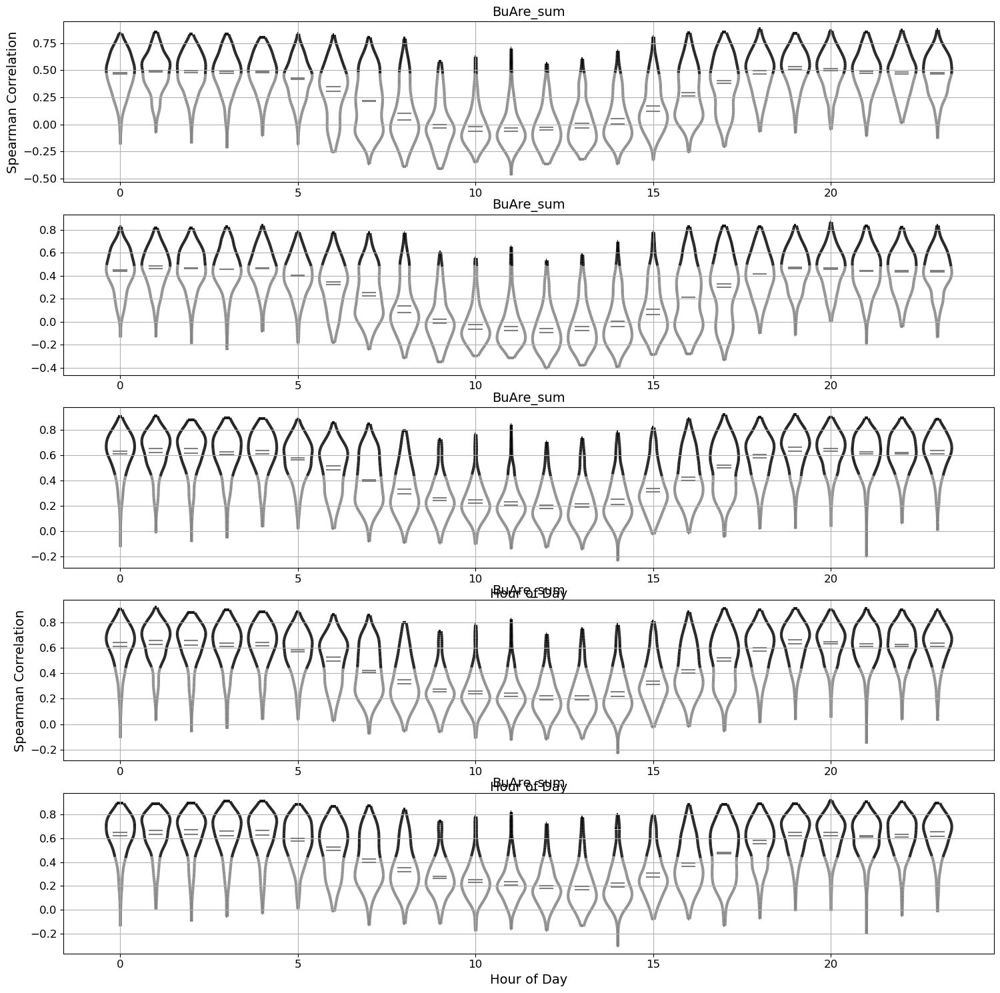

In [27]:
diurnal_scale(season='year', radius_list=[100,200,300,400,500], var='BuAre_sum')

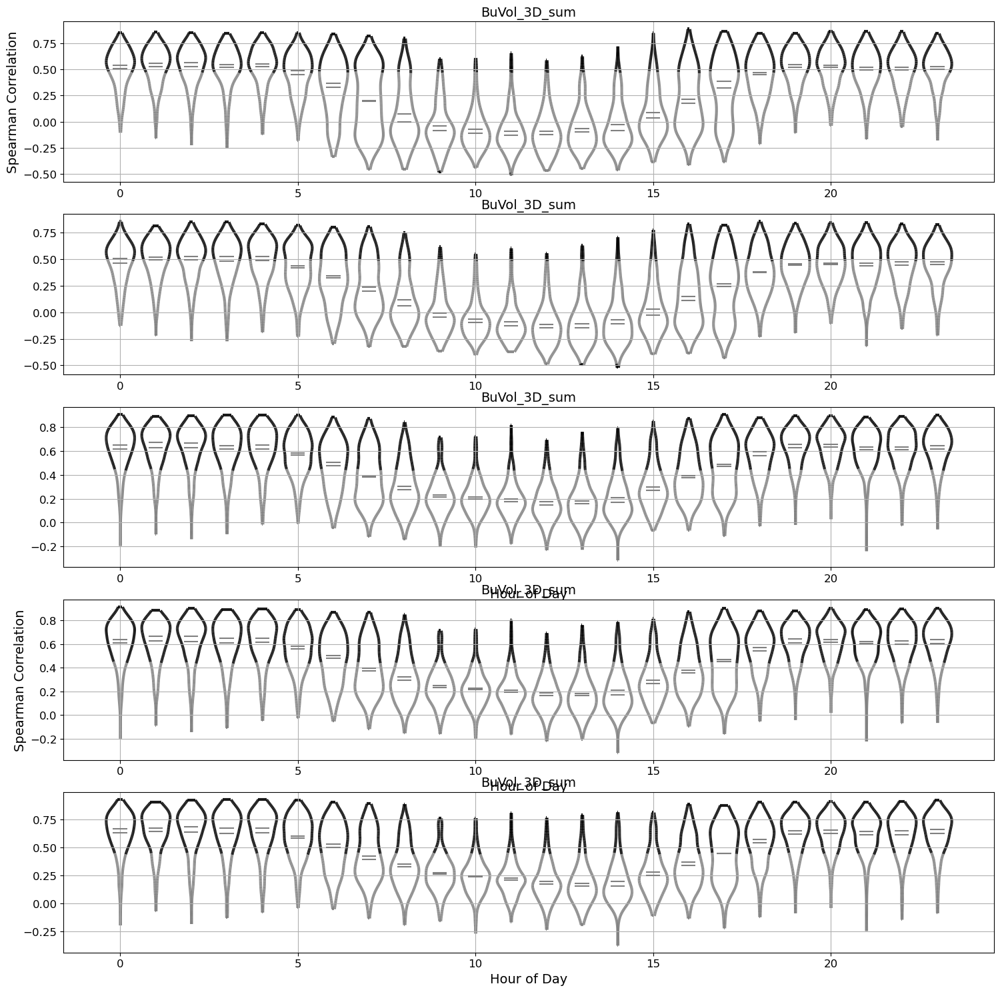

In [28]:
diurnal_scale(season='year', radius_list=[100,200,300,400,500], var='BuVol_3D_sum')

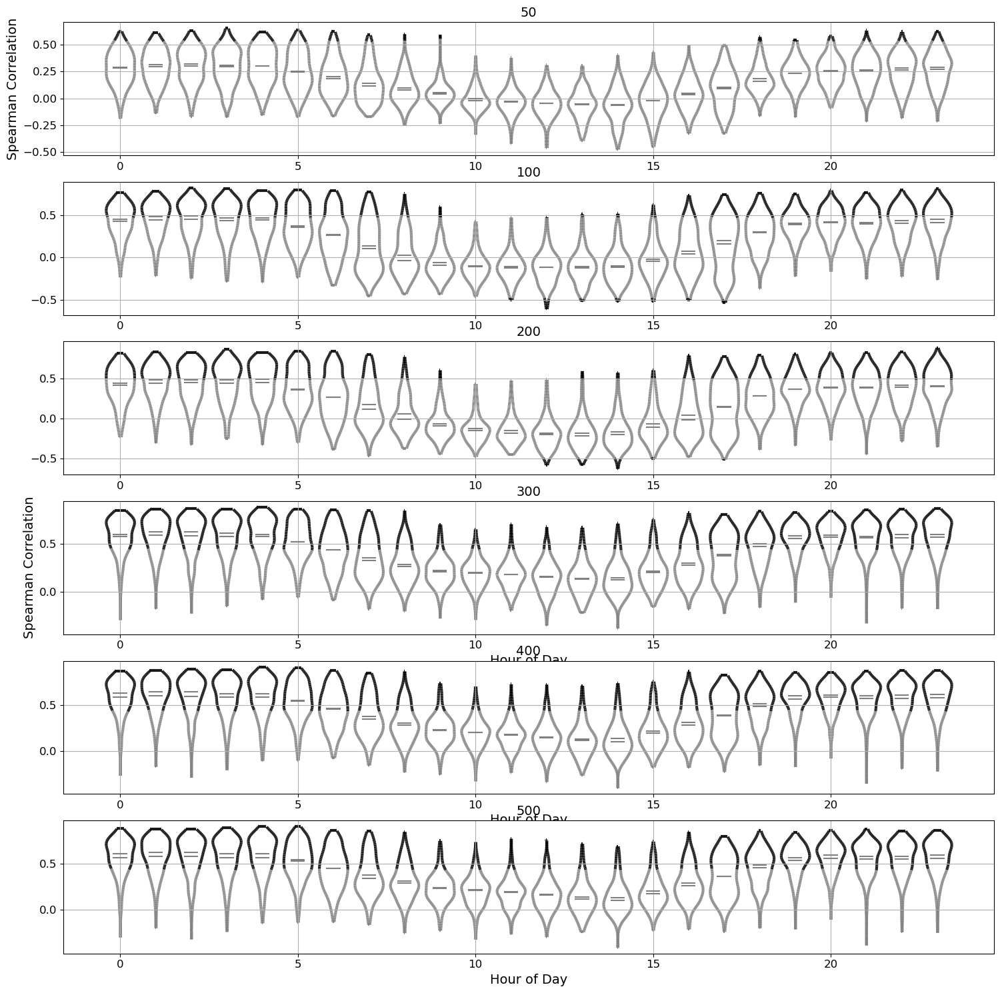

In [34]:
diurnal_scale(season='year', radius_list=[50,100,200,300,400,500], var='BuHt_wmean')

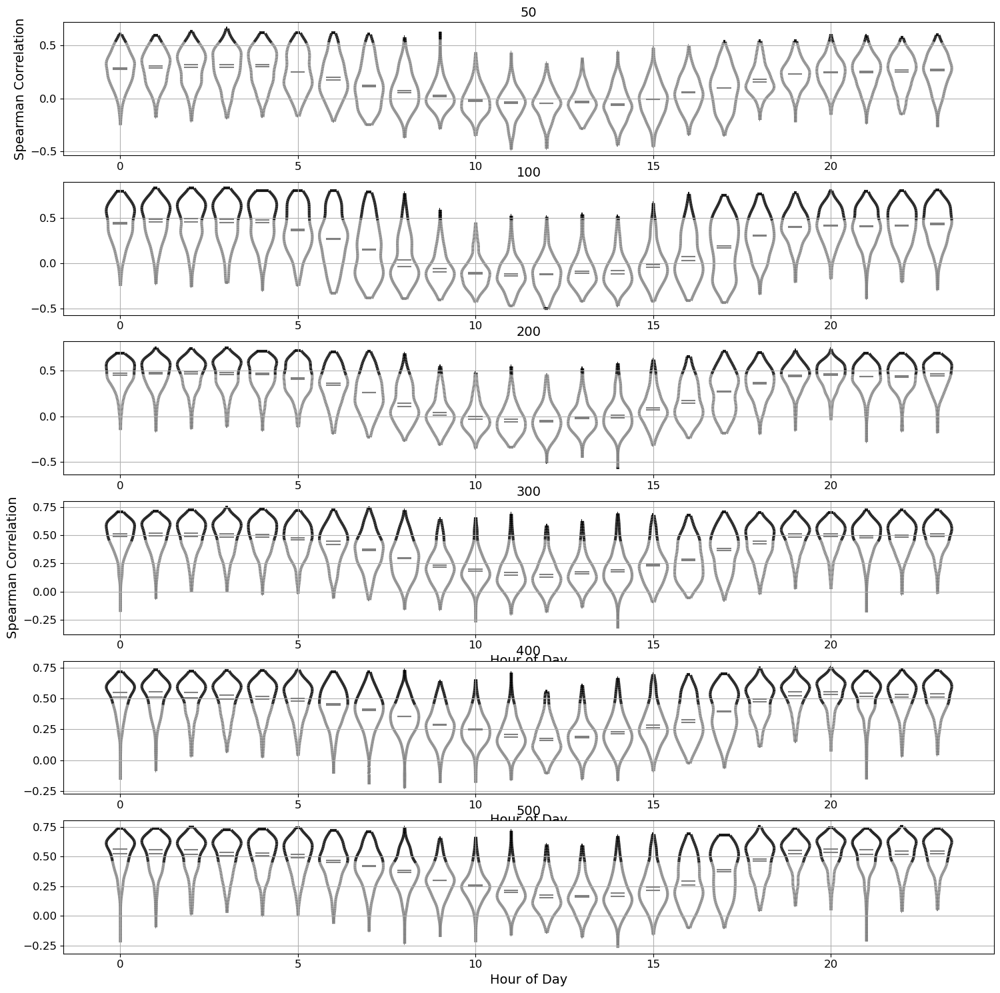

In [21]:
diurnal_scale(season='year', radius_list=[50,100,200,300,400,500], var='BuHt_max')

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_9059/1471215779.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


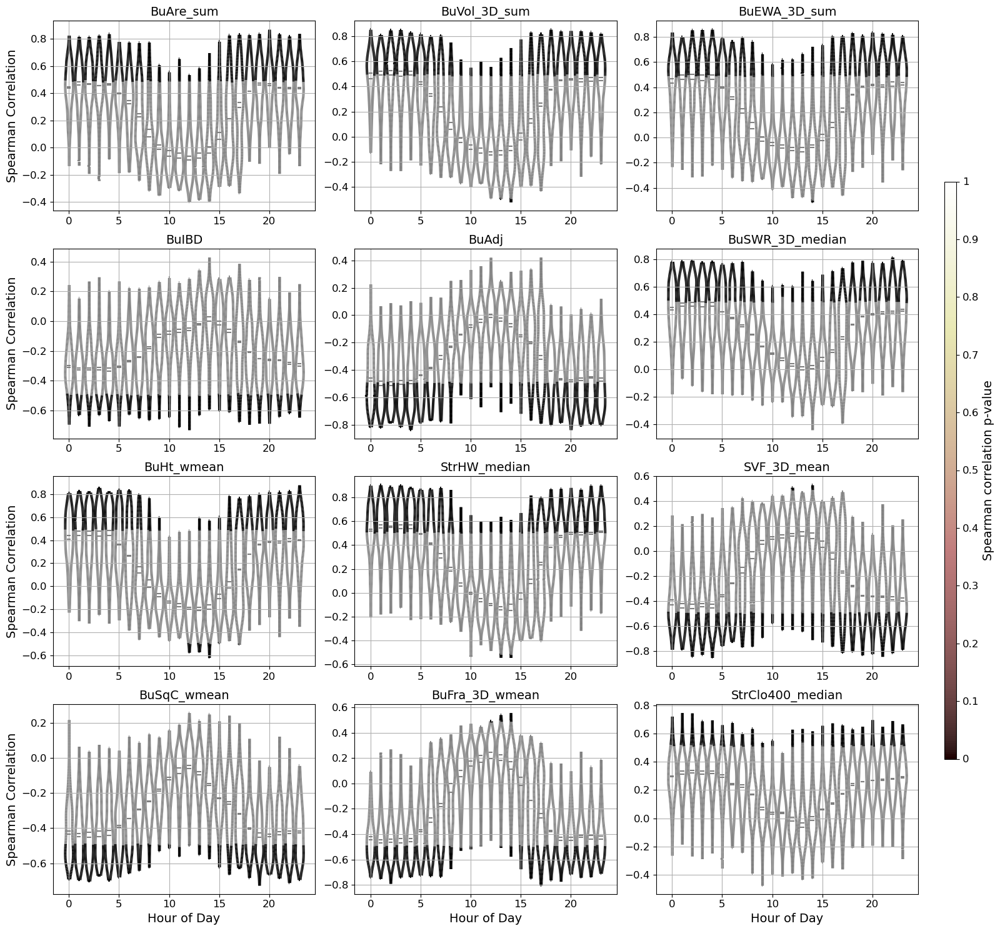

In [24]:
plot_diurnal_pub_greys(season='year', radius=200)

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_7616/3974612146.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


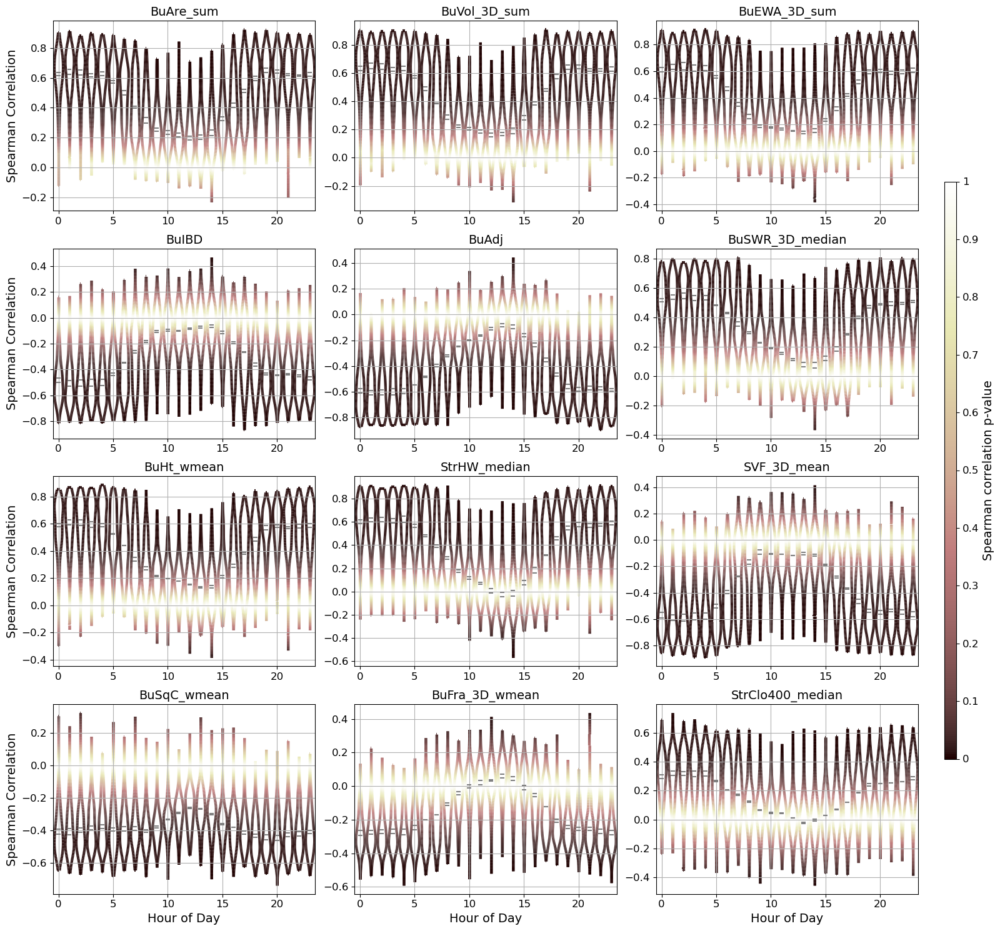

In [19]:
plot_diurnal_pub(season='year', radius=300)

In [20]:
temp = pd.read_csv('/Users/lisawink/Documents/paper1/data/gap_filled_data_ta_rh.csv')
temp['datetime_UTC']=pd.to_datetime(temp['datetime_UTC'])
calc_diurnal(temp[['datetime_UTC']], radius=100, season='year')

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_7616/3974612146.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


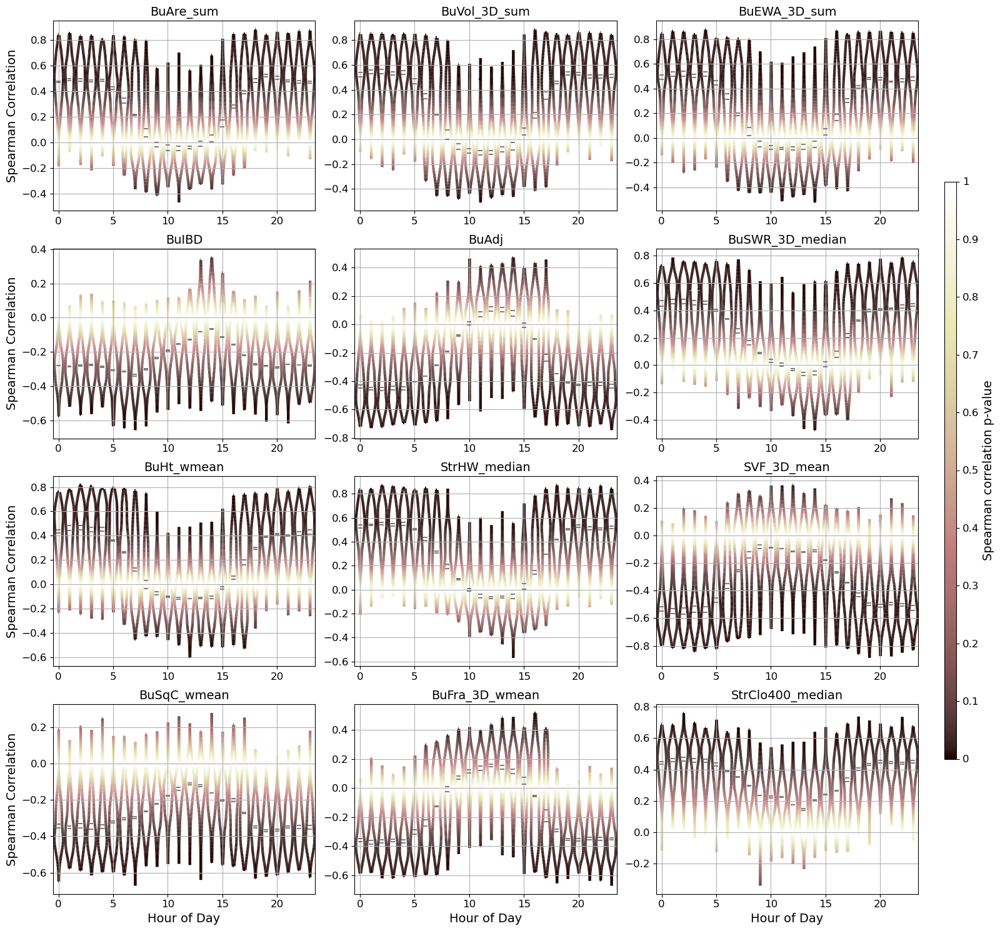

In [21]:
plot_diurnal_pub(season='year', radius=100)

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_7616/2513353668.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


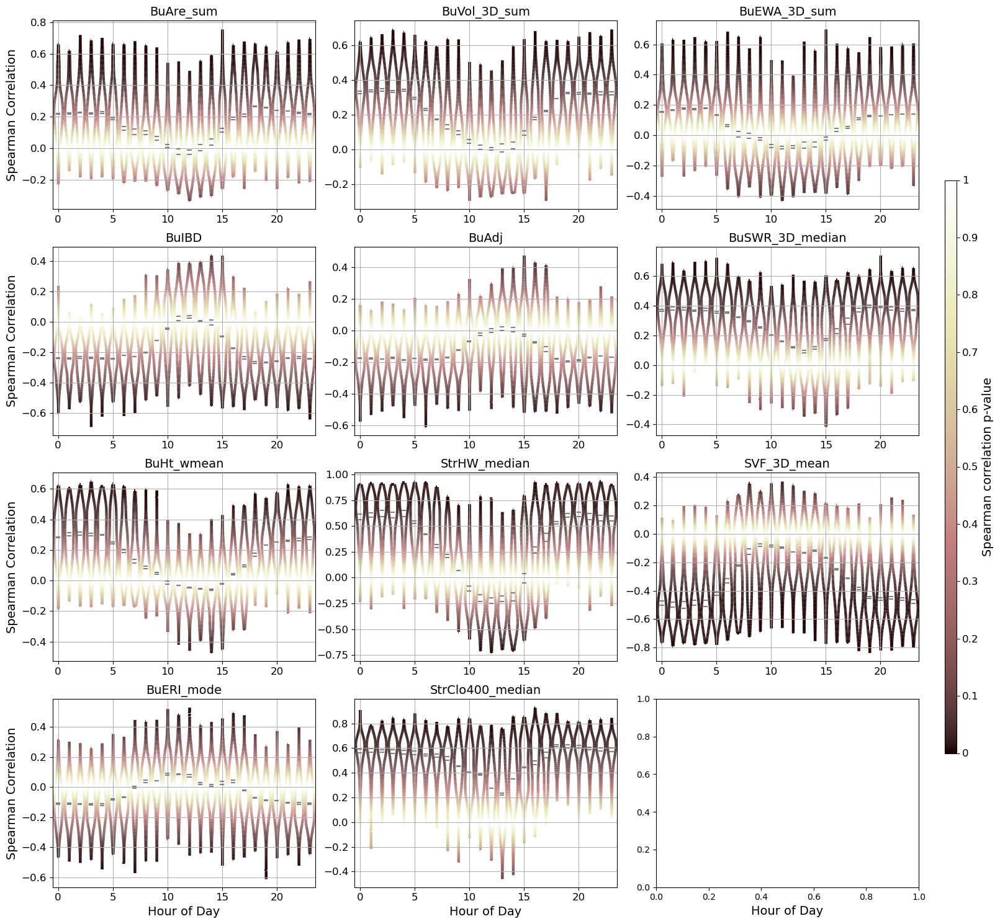

In [27]:
plot_diurnal_pub(season='year', radius=50)

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_68004/1293155063.py:98: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


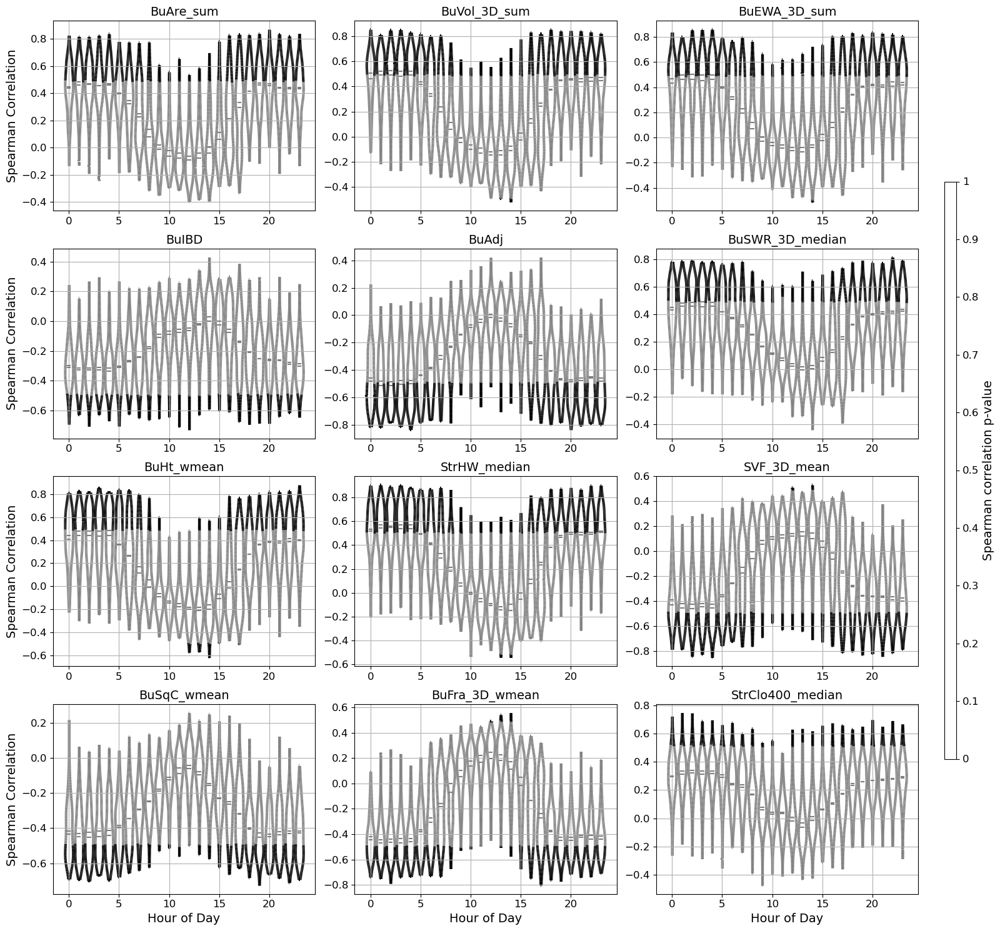

In [218]:
plot_diurnal_pub(season='year', radius=200)

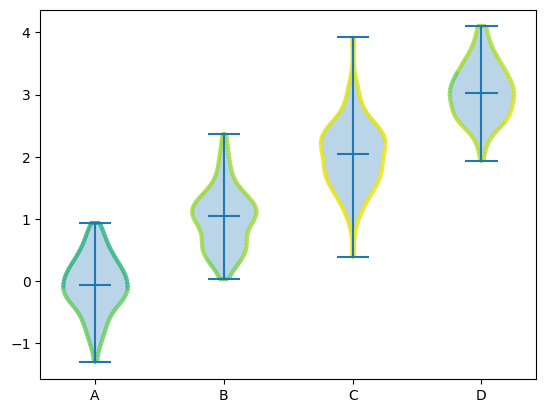

In [177]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.collections import PolyCollection

# Example data
np.random.seed(42)
categories = ['A', 'B', 'C', 'D']
data = [np.random.normal(loc=i, scale=0.5, size=100) for i in range(len(categories))]

# Generate synthetic p-values for testing (Replace with actual p-values)
p_values = [np.abs(np.sin(d)) for d in data]  

# Create figure
fig, ax = plt.subplots()

# Create the violin plot
violin_parts = ax.violinplot(data, showmeans=False, showmedians=True)

# Choose colormap
cmap = plt.cm.viridis  # Change to plasma, coolwarm, or turbo for better contrast
norm = mcolors.LogNorm(vmin=np.min([p.min() for p in p_values]), vmax=np.max([p.max() for p in p_values]))  # Normalize across all p-values
#norm = mcolors.LogNorm(vmin=np.min(p_values) + 1e-6, vmax=np.max(p_values))


# Apply p-value-based colors per y-value within each violin
for i, pc in enumerate(violin_parts['bodies']):
    verts = pc.get_paths()[0].vertices  # Get vertices of the violin
    x = verts[:, 0]  # X-coordinates
    y = verts[:, 1]  # Y-coordinates

    # Interpolate p-values based on y-values (this ensures a gradient)
    p_interp = np.interp(y, data[i], p_values[i])  

    # Map the interpolated p-values to colors
    colors = cmap(norm(p_interp))

    # Split the violin into small horizontal segments
    for j in range(len(y) - 1):
        x_segment = [x[j], x[j + 1], x[j + 1], x[j]]  # Define segment as a quadrilateral
        y_segment = [y[j], y[j + 1], y[j + 1], y[j]]
        segment_color = colors[j]  # Assign color for this segment

        # Create a small colored polygon for this segment
        poly = PolyCollection([list(zip(x_segment, y_segment))], alpha=0.9, linewidth=3)
        poly.set_facecolor([segment_color])
        poly.set_edgecolor([segment_color])
        ax.add_collection(poly)
        
    # Hide original violin body to show gradient
    #pc.set_alpha(0)
    
    # Hide original violin body to show gradient
    #pc.set_alpha(0)

# Format plot
ax.set_xticks(np.arange(1, len(categories) + 1))
ax.set_xticklabels(categories)

# Add a colorbar to show p-value mapping
#plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), label="P-Value")

plt.show()


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_68004/1988654064.py:93: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


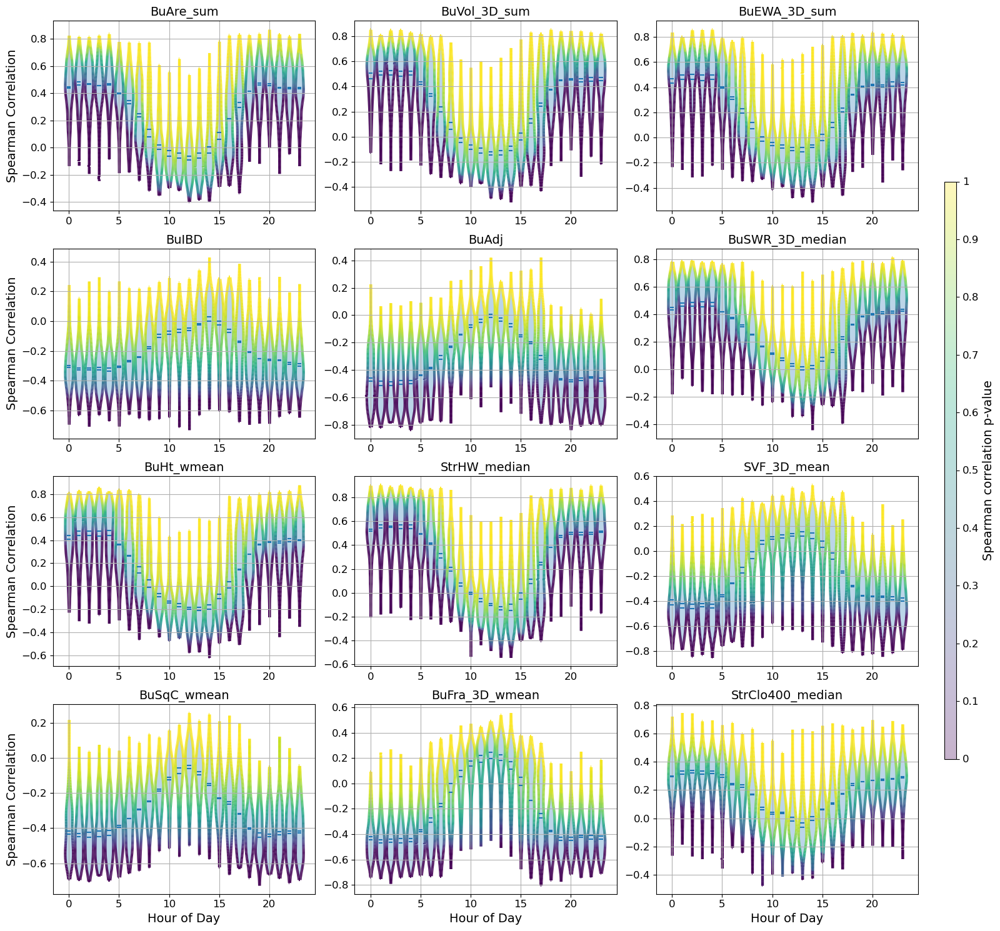

In [176]:
plot_diurnal_pub(season='year', radius=200)

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_68004/2454157231.py:48: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


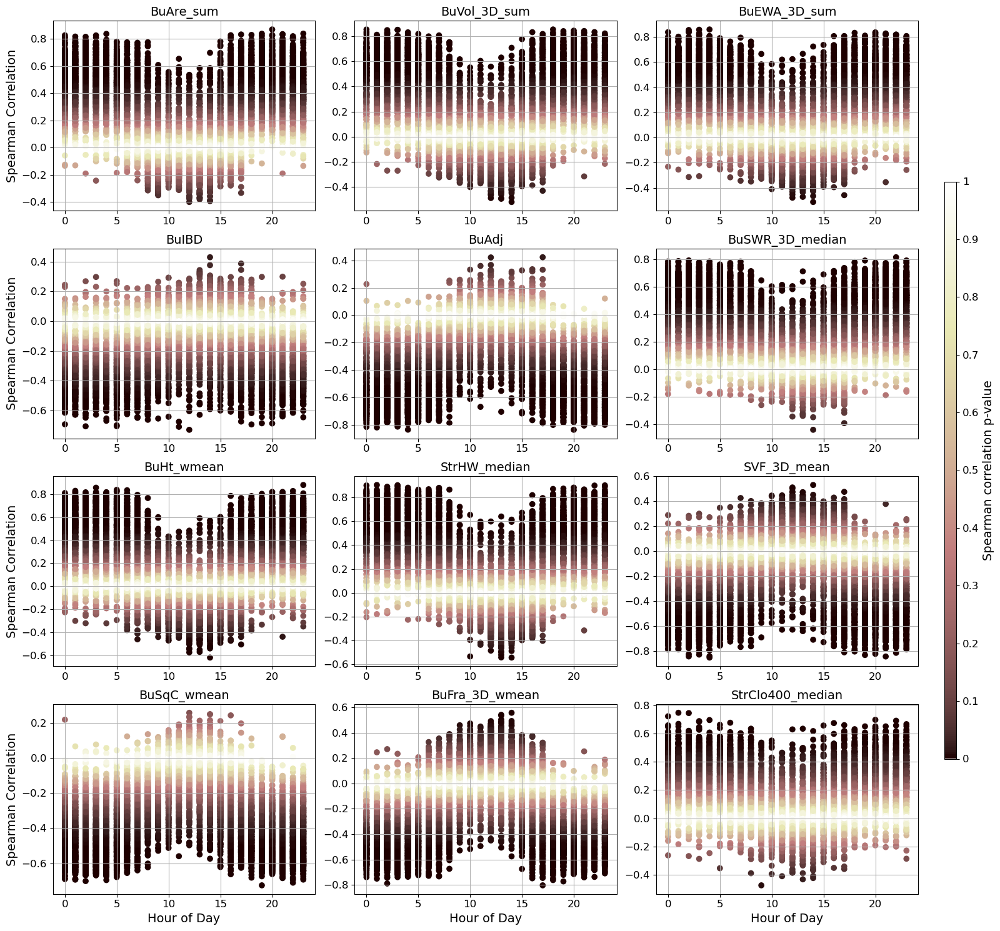

In [24]:
plot_diurnal_pub(season='year', radius=200)

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_19138/488897589.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


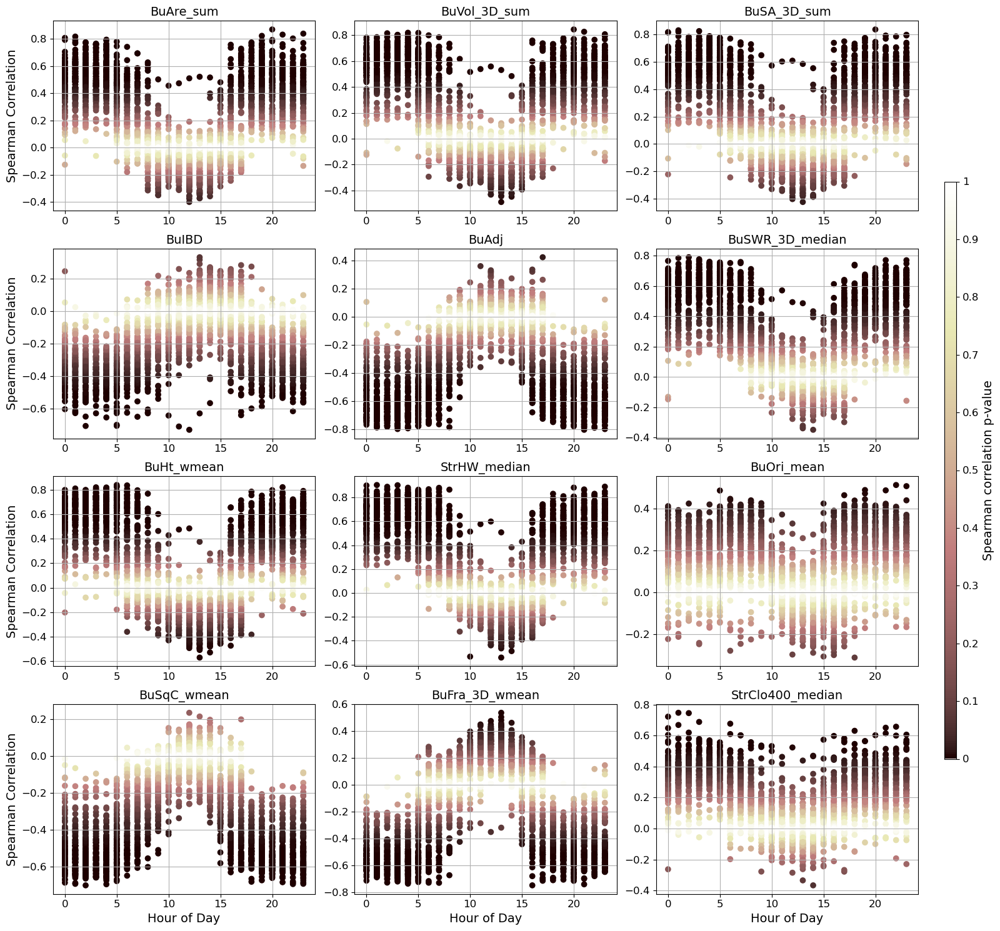

In [7]:
plot_diurnal_pub(season='year', radius=200)

In [25]:
ex_stats = pd.read_csv("/Users/lisawink/Documents/paper1/data/processed_data/diurnal/all_year/('year', 'StrHW_median', 200).csv")

In [26]:
ex_stats['Time'] = pd.to_datetime(ex_stats['Time'])

In [15]:
# find highest correlation at 13:00
ex_stats[ex_stats['Time'].dt.hour == 13].sort_values(by='Spearman Correlation')

,Unnamed: 0,Parameter,Parameter.1,Pearson Correlation,Pearson p-value,Spearman Correlation,Spearman p-value,Mutual Information,Time
1333,2023-04-20 13:00:00+00:00,StrHW_median,StrHW_median,-0.465297,0.010976,-0.541513,0.002415,0.141340,2023-04-20 13:00:00+00:00
613,2022-11-07 13:00:00+00:00,StrHW_median,StrHW_median,-0.402505,0.030410,-0.464589,0.011114,0.000000,2022-11-07 13:00:00+00:00
349,2022-10-16 13:00:00+00:00,StrHW_median,StrHW_median,-0.338160,0.072778,-0.446798,0.015106,0.000000,2022-10-16 13:00:00+00:00
229,2022-10-04 13:00:00+00:00,StrHW_median,StrHW_median,-0.420169,0.023247,-0.442857,0.016134,0.000000,2022-10-04 13:00:00+00:00
637,2022-11-08 13:00:00+00:00,StrHW_median,StrHW_median,-0.311835,0.099605,-0.439901,0.016943,0.035091,2022-11-08 13:00:00+00:00
...,...,...,...,...,...,...,...,...,...
1213,2023-04-04 13:00:00+00:00,StrHW_median,StrHW_median,0.120739,0.532700,0.050739,0.793794,0.000000,2023-04-04 13:00:00+00:00
2293,2023-07-23 13:00:00+00:00,StrHW_median,StrHW_median,0.060945,0.753481,0.069510,0.720127,0.000000,2023-07-23 13:00:00+00:00
1693,2023-06-04 13:00:00+00:00,StrHW_median,StrHW_median,0.077489,0.689499,0.089655,0.643720,0.000000,2023-06-04 13:00:00+00:00
2245,2023-07-21 13:00:00+00:00,StrHW_median,StrHW_median,0.278054,0.144158,0.131067,0.497961,0.000000,2023-07-21 13:00:00+00:00


In [16]:
ex_stats = pd.read_csv("/Users/lisawink/Documents/paper1/data/processed_data/diurnal/('year', 'BuFra_3D_wmean', 200).csv")
ex_stats['Time'] = pd.to_datetime(ex_stats['Time'])
ex_stats[ex_stats['Time'].dt.hour == 13].sort_values(by='Spearman Correlation')

,Unnamed: 0,Parameter,Parameter.1,Pearson Correlation,Pearson p-value,Spearman Correlation,Spearman p-value,Mutual Information,Time
709,2022-12-09 13:00:00+00:00,BuFra_3D_wmean,BuFra_3D_wmean,-0.333396,0.066828,-0.319306,0.079959,0.044071,2022-12-09 13:00:00+00:00
2293,2023-07-23 13:00:00+00:00,BuFra_3D_wmean,BuFra_3D_wmean,0.036179,0.846784,0.041368,0.825125,0.000000,2023-07-23 13:00:00+00:00
1573,2023-05-29 13:00:00+00:00,BuFra_3D_wmean,BuFra_3D_wmean,0.053958,0.773123,0.071983,0.700375,0.001042,2023-05-29 13:00:00+00:00
757,2022-12-27 13:00:00+00:00,BuFra_3D_wmean,BuFra_3D_wmean,-0.013666,0.941832,0.077435,0.678841,0.000000,2022-12-27 13:00:00+00:00
1693,2023-06-04 13:00:00+00:00,BuFra_3D_wmean,BuFra_3D_wmean,0.126185,0.498782,0.093952,0.615162,0.014042,2023-06-04 13:00:00+00:00
...,...,...,...,...,...,...,...,...,...
1285,2023-04-09 13:00:00+00:00,BuFra_3D_wmean,BuFra_3D_wmean,0.401320,0.025244,0.445206,0.012082,0.082712,2023-04-09 13:00:00+00:00
925,2023-02-10 13:00:00+00:00,BuFra_3D_wmean,BuFra_3D_wmean,0.436376,0.014119,0.458065,0.009560,0.021339,2023-02-10 13:00:00+00:00
949,2023-02-11 13:00:00+00:00,BuFra_3D_wmean,BuFra_3D_wmean,0.464847,0.008420,0.480944,0.006165,0.101748,2023-02-11 13:00:00+00:00
1069,2023-02-21 13:00:00+00:00,BuFra_3D_wmean,BuFra_3D_wmean,0.480816,0.006181,0.504134,0.003832,0.238827,2023-02-21 13:00:00+00:00


In [21]:
ex_stats = pd.read_csv("/Users/lisawink/Documents/paper1/data/processed_data/diurnal/('year', 'BuSA_3D_sum', 200).csv")
ex_stats['Time'] = pd.to_datetime(ex_stats['Time'])
ex_stats[ex_stats['Time'].dt.hour == 13].sort_values(by='Spearman Correlation')

,Unnamed: 0,Parameter,Parameter.1,Pearson Correlation,Pearson p-value,Spearman Correlation,Spearman p-value,Mutual Information,Time
1333,2023-04-20 13:00:00+00:00,BuSA_3D_sum,BuSA_3D_sum,-0.394953,0.027884,-0.425287,0.017075,0.171816,2023-04-20 13:00:00+00:00
925,2023-02-10 13:00:00+00:00,BuSA_3D_sum,BuSA_3D_sum,-0.403362,0.024442,-0.383871,0.033014,0.091833,2023-02-10 13:00:00+00:00
877,2023-02-08 13:00:00+00:00,BuSA_3D_sum,BuSA_3D_sum,-0.387016,0.031486,-0.378226,0.035907,0.062571,2023-02-08 13:00:00+00:00
1069,2023-02-21 13:00:00+00:00,BuSA_3D_sum,BuSA_3D_sum,-0.413102,0.020900,-0.376286,0.036947,0.174351,2023-02-21 13:00:00+00:00
349,2022-10-16 13:00:00+00:00,BuSA_3D_sum,BuSA_3D_sum,-0.339265,0.061883,-0.370161,0.040391,0.080251,2022-10-16 13:00:00+00:00
...,...,...,...,...,...,...,...,...,...
2125,2023-06-29 13:00:00+00:00,BuSA_3D_sum,BuSA_3D_sum,0.051311,0.783988,0.137771,0.459852,0.024033,2023-06-29 13:00:00+00:00
2293,2023-07-23 13:00:00+00:00,BuSA_3D_sum,BuSA_3D_sum,0.108424,0.561519,0.160630,0.388016,0.051475,2023-07-23 13:00:00+00:00
1573,2023-05-29 13:00:00+00:00,BuSA_3D_sum,BuSA_3D_sum,0.090643,0.627720,0.174816,0.346907,0.000000,2023-05-29 13:00:00+00:00
1693,2023-06-04 13:00:00+00:00,BuSA_3D_sum,BuSA_3D_sum,0.091610,0.624040,0.190323,0.305110,0.092601,2023-06-04 13:00:00+00:00


# Summer

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_19138/488897589.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


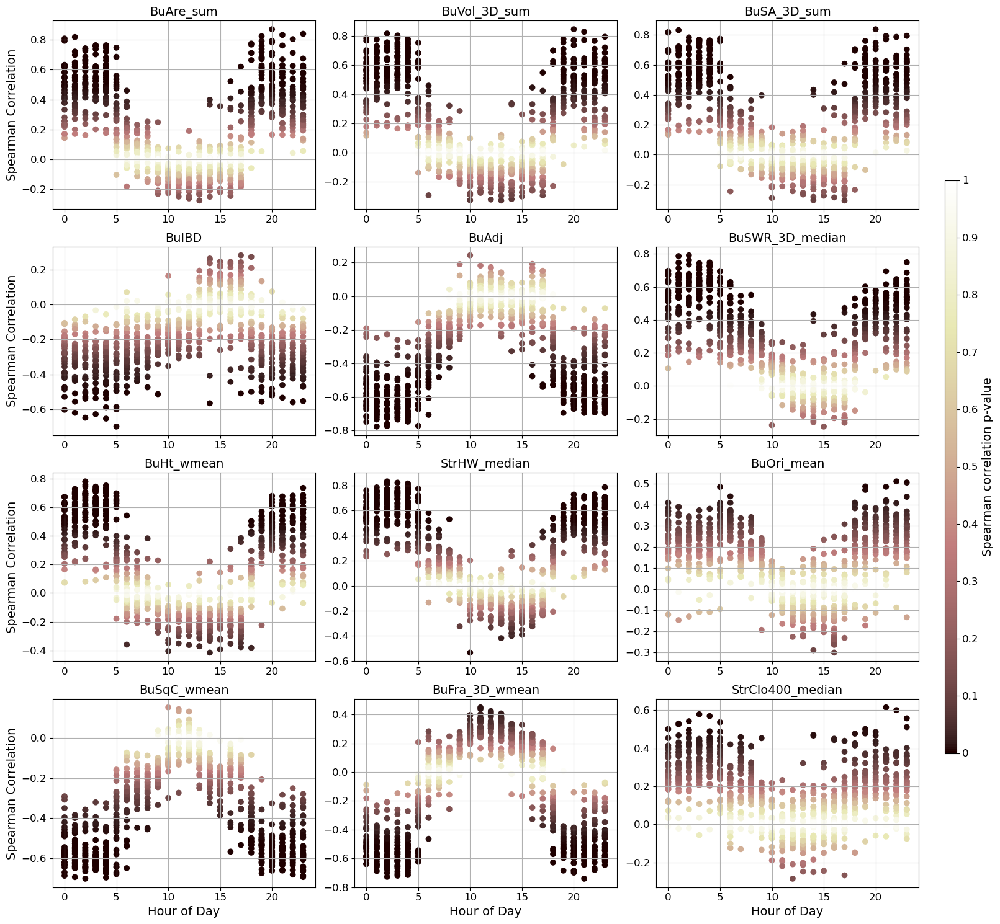

In [8]:
plot_diurnal_pub(season='summer', radius=200)

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_19138/3216637168.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


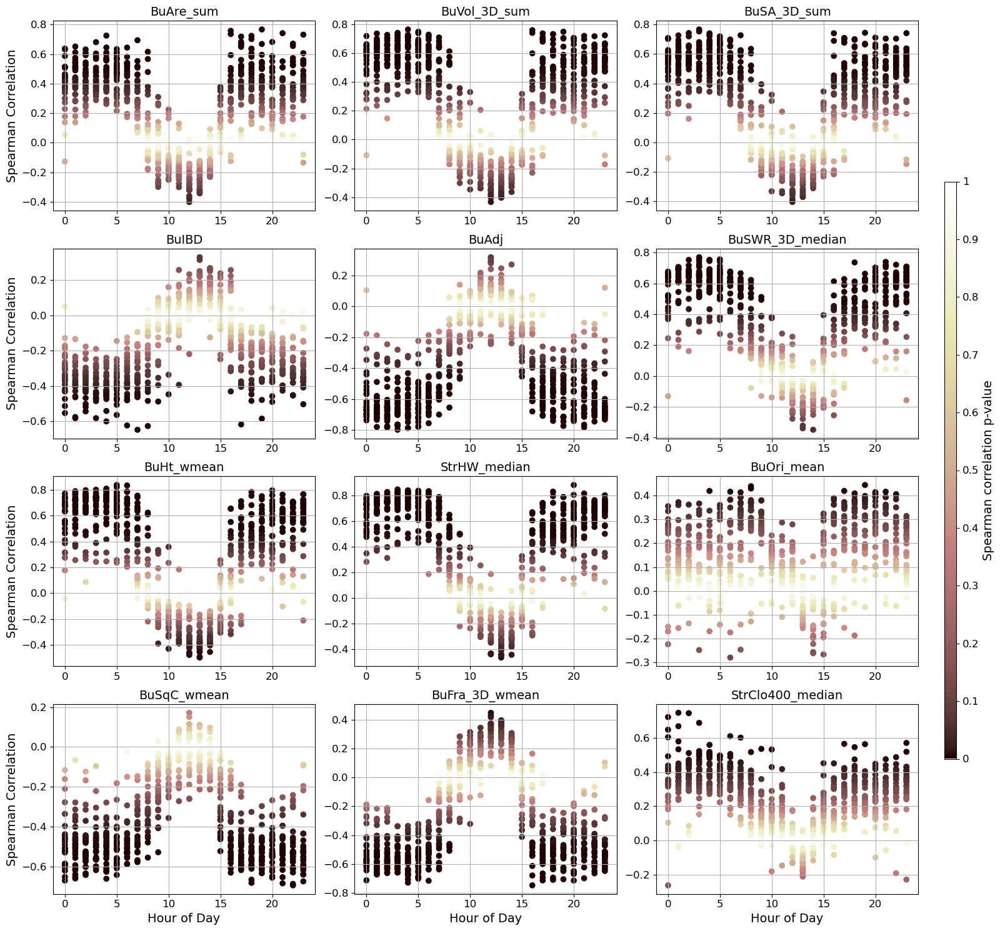

In [26]:
plot_diurnal_pub(season='autumn', radius=200)

# Winter

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_19138/488897589.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


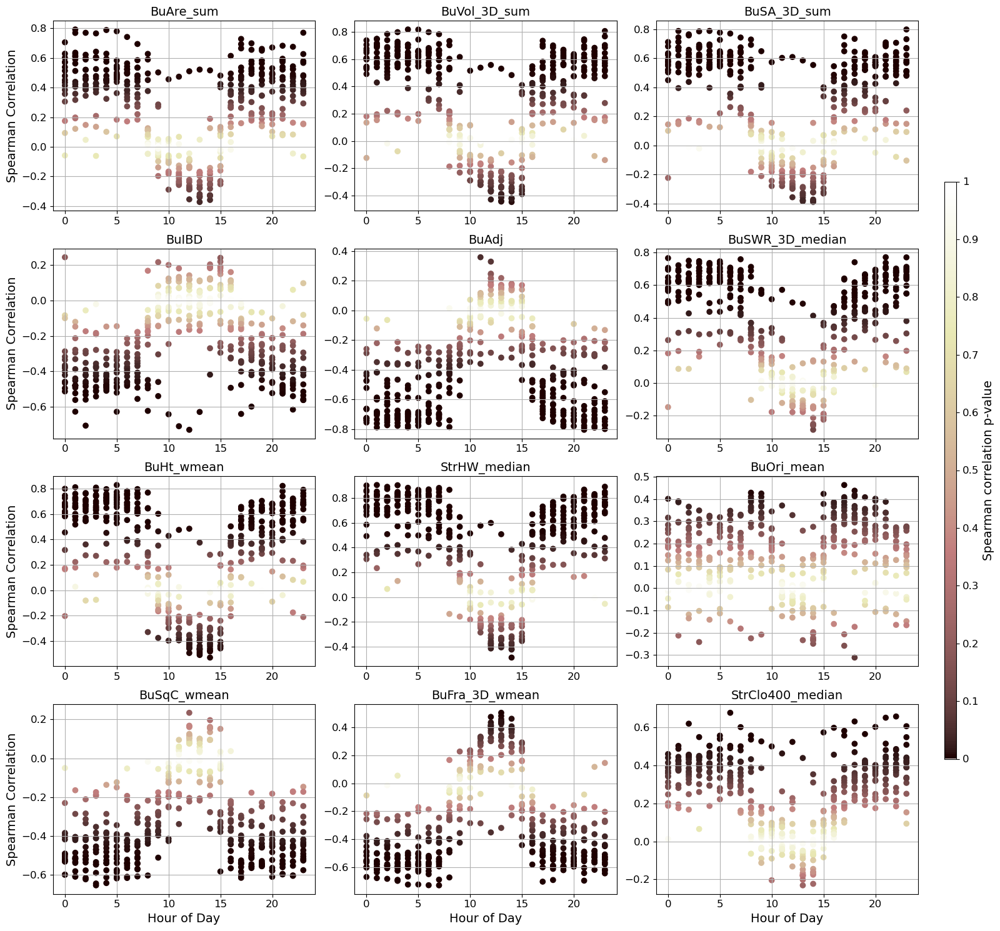

In [9]:
plot_diurnal_pub(season='winter', radius=200)

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_19138/3216637168.py:52: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


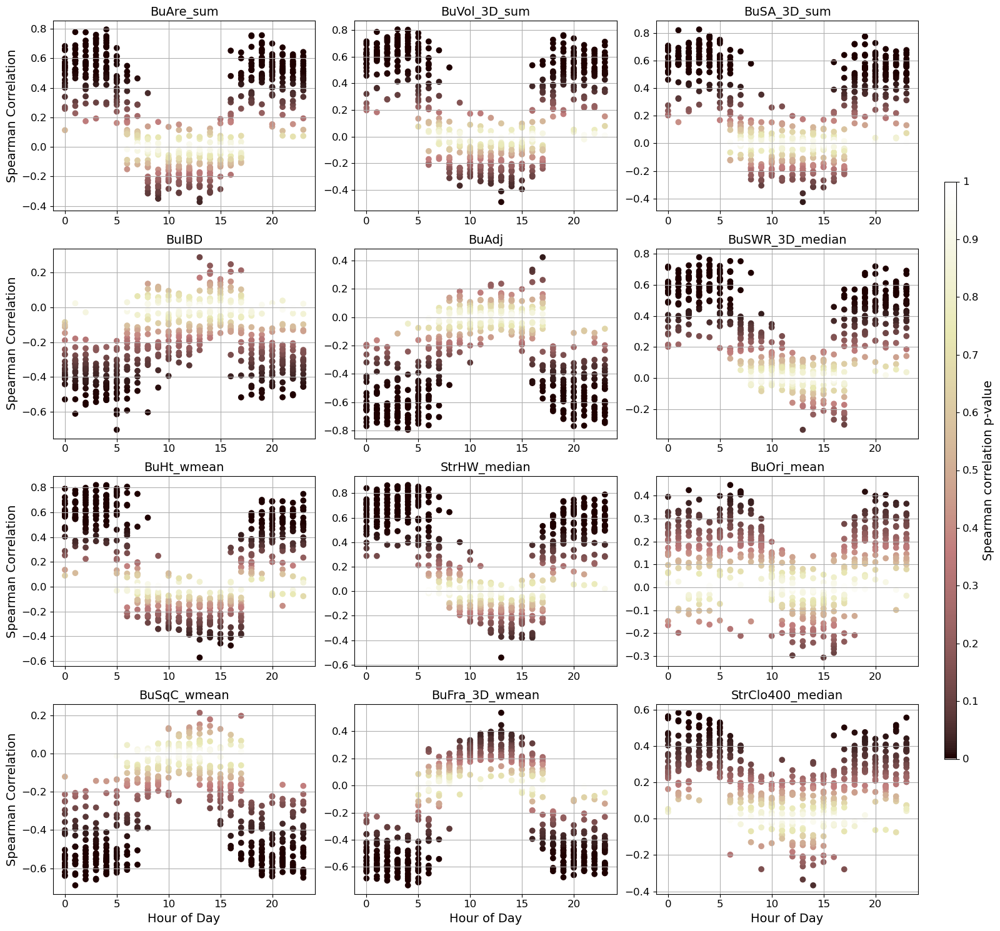

In [27]:
plot_diurnal_pub(season='spring', radius=200)

## Summer

In [130]:
hid = pd.read_csv('/Users/lisawink/Documents/paper1/data/processed_data/heat_island_dates.csv')
hid['datetime_UTC']=pd.to_datetime(hid['datetime_UTC'])

In [131]:
hid = hid[hid['datetime_UTC'].dt.month.isin([6,7,8,9])]

In [133]:
i = 200

In [137]:
calc_diurnal(hid, radius=200, season='summer')

## Winter

In [147]:
hid = hid[hid['datetime_UTC'].dt.month.isin([11,12,1,2])]

In [151]:
calc_diurnal(hid, radius=50, season='winter')